In [3]:
!pip install pycocotools

  Using cached pycocotools-2.0.7-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (403 kB)
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [3]:
import tensorflow as tf
import keras 
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm
import re
from keras.preprocessing.image import img_to_array

In [4]:
import os
import re
import cv2
import numpy as np
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import img_to_array

# To get the files in proper order (like your original code)
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
    return sorted(data, key=alphanum_key)

# Defining the size of the image
SIZE = 256

# Initialize empty lists for color and grayscale images
color_img = []
gray_img = []

# Path to your COCO dataset on Kaggle
coco_images_path = '/kaggle/input/coco-image-caption/train2014/train2014'

# Get all files in the directory
files = os.listdir(coco_images_path)
# Sort files to ensure consistent order
files = sorted_alphanumeric(files)

# Limit to top 4200 images
files = files[:4200]

print(f"Processing {len(files)} images from COCO dataset...")

# Process each image
for i in tqdm(files):    
    try:
        # Load image
        img_path = os.path.join(coco_images_path, i)
        img = cv2.imread(img_path, 1)
        
        if img is None:
            print(f"Warning: Unable to load image {img_path}. Skipping.")
            continue
            
        # Convert to RGB (OpenCV reads images in BGR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Resize image
        img = cv2.resize(img, (SIZE, SIZE))
        
        # Normalize image
        img = img.astype('float32') / 255.0
        
        # Add to color images
        color_img.append(img_to_array(img))
        
        # Create grayscale version
        gray = cv2.cvtColor(img.astype(np.float32) * 255, cv2.COLOR_RGB2GRAY) / 255.0
        
        # Convert grayscale image back to 3 channels (but still grayscale)
        gray_3ch = np.stack([gray, gray, gray], axis=-1)
        
        # Add to grayscale images
        gray_img.append(img_to_array(gray_3ch))
        
    except Exception as e:
        print(f"Error processing image {i}: {e}")

# Convert lists to numpy arrays
color_img = np.array(color_img)
gray_img = np.array(gray_img)

print(f"Loaded {len(color_img)} image pairs")
print(f"Color images shape: {color_img.shape}")
print(f"Grayscale images shape: {gray_img.shape}")

# Function to visualize sample images
def show_sample_images(color_imgs, gray_imgs, num_samples=3):
    import matplotlib.pyplot as plt
    
    plt.figure(figsize=(12, 8))
    for i in range(num_samples):
        # Show original color image
        plt.subplot(2, num_samples, i+1)
        plt.imshow(color_imgs[i])
        plt.title(f"Color Image {i+1}")
        plt.axis('off')
        
        # Show grayscale version
        plt.subplot(2, num_samples, i+num_samples+1)
        plt.imshow(gray_imgs[i])
        plt.title(f"Grayscale Image {i+1}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Optional: Call the function to visualize sample images
# show_sample_images(color_img, gray_img)

# Function to save processed data (optional)
def save_processed_data(color_imgs, gray_imgs, save_path='/kaggle/working/'):
    np.save(os.path.join(save_path, 'coco_color_images.npy'), color_imgs)
    np.save(os.path.join(save_path, 'coco_gray_images.npy'), gray_imgs)
    print(f"Saved processed data to {save_path}")

# Optional: Call the function to save the processed data
# save_processed_data(color_img, gray_img)

  0%|          | 4/4200 [00:00<02:00, 34.86it/s]

Processing 4200 images from COCO dataset...


100%|██████████| 4200/4200 [01:15<00:00, 55.85it/s]


Loaded 4200 image pairs
Color images shape: (4200, 256, 256, 3)
Grayscale images shape: (4200, 256, 256, 3)


In [5]:
color_dataset=tf.data.Dataset.from_tensor_slices(np.array(color_img[:4000])).batch(64)
gray_dataset=tf.data.Dataset.from_tensor_slices(np.array(gray_img[:4000])).batch(64)

color_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(color_img[4000:])).batch(8)
gray_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(gray_img[4000:])).batch(8)

In [6]:
example_color = next(iter(color_dataset))
example_gray = next(iter(gray_dataset))

In [7]:
def plot_images(a = 4):
    
    for i in range(a):
        plt.figure(figsize = (10,10))
        plt.subplot(121)
        plt.title('color')
        plt.imshow(example_color[i] )

        plt.subplot(122)
        plt.title('gray')
        plt.imshow(example_gray[i])
        plt.show()

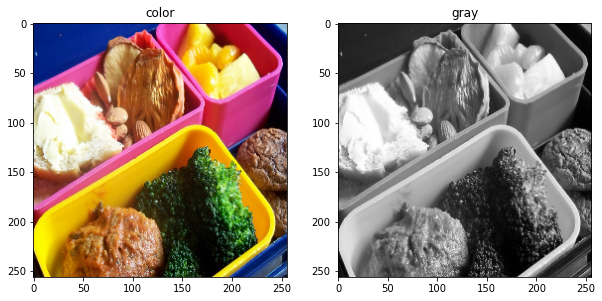

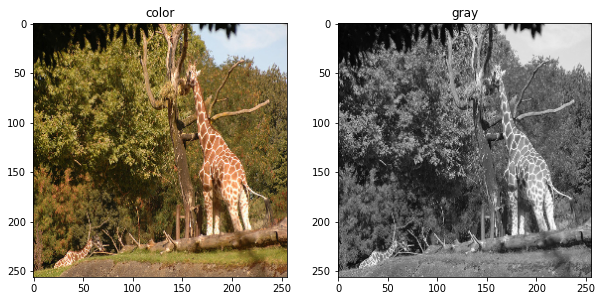

In [8]:
plot_images(2)

## Model

In [13]:
# Enhanced downsample function with improved normalization and dropout
def downsample(filters, size, apply_batchnorm=True, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                               kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.3))  # Adding dropout to some downsampling layers

    result.add(tf.keras.layers.LeakyReLU(alpha=0.2))  # Optimized LeakyReLU alpha

    return result

# Enhanced upsample function with additional options
def upsample(filters, size, apply_dropout=False, apply_attention=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

# Self-attention layer for the generator
# Fixed self-attention layer for the generator
def self_attention_block(x, filters):
    """Self attention block for the generator based on SA-GAN"""
    # Get shape using TensorFlow operations
    batch_size = tf.shape(x)[0]
    height = tf.shape(x)[1]
    width = tf.shape(x)[2]
    
    # Create the query, key, value tensors
    f = tf.keras.layers.Conv2D(filters // 8, 1, padding='same')(x)
    g = tf.keras.layers.Conv2D(filters // 8, 1, padding='same')(x)
    h = tf.keras.layers.Conv2D(filters, 1, padding='same')(x)
    
    # Reshape for matrix multiplication
    f_flattened = tf.reshape(f, [batch_size, -1, filters // 8])
    g_flattened = tf.reshape(g, [batch_size, -1, filters // 8])
    h_flattened = tf.reshape(h, [batch_size, -1, filters])
    
    # Perform matrix multiplication
    s = tf.matmul(g_flattened, f_flattened, transpose_b=True)
    
    # Apply softmax to get attention weights
    beta = tf.nn.softmax(s, axis=-1)
    
    # Apply attention weights to the value tensor
    o = tf.matmul(beta, h_flattened)
    
    # Reshape back to the original shape
    o = tf.reshape(o, [batch_size, height, width, filters])
    
    # Scale the output
    gamma = tf.Variable(0.0, trainable=True)
    o = gamma * o + x
    
    return o

In [29]:
# Enhanced Generator with self-attention
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    # Enhanced down stack with more regularization
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
        downsample(128, 4),  # (bs, 64, 64, 128)
        downsample(256, 4),  # (bs, 32, 32, 256)
        downsample(512, 4, apply_dropout=True),  # (bs, 16, 16, 512) - added dropout
        downsample(512, 4),  # (bs, 8, 8, 512)
        downsample(512, 4),  # (bs, 4, 4, 512)
        downsample(512, 4),  # (bs, 2, 2, 512)
        downsample(512, 4),  # (bs, 1, 1, 512)
    ]

    # Enhanced up stack
    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
        upsample(512, 4),  # (bs, 16, 16, 1024)
        upsample(256, 4),  # (bs, 32, 32, 512)
        upsample(128, 4),  # (bs, 64, 64, 256)
        upsample(64, 4),  # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])


    # Upsampling and establishing the skip connections
    for i, (up, skip) in enumerate(zip(up_stack, skips)):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [30]:
generator = Generator()
generator.summary()


Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential_30 (Sequential)      (None, 128, 128, 64) 3072        input_6[0][0]                    
__________________________________________________________________________________________________
sequential_31 (Sequential)      (None, 64, 64, 128)  131584      sequential_30[0][0]              
__________________________________________________________________________________________________
sequential_32 (Sequential)      (None, 32, 32, 256)  525312      sequential_31[0][0]              
____________________________________________________________________________________________

In [16]:
def spectral_norm(w, iteration=1):
    w_shape = w.shape.as_list()
    w = tf.reshape(w, [-1, w_shape[-1]])

    u = tf.Variable(tf.random.normal([1, w_shape[-1]]), trainable=False)

    u_hat = u
    v_hat = None
    for i in range(iteration):
        v_ = tf.matmul(u_hat, tf.transpose(w))
        v_hat = tf.nn.l2_normalize(v_)

        u_ = tf.matmul(v_hat, w)
        u_hat = tf.nn.l2_normalize(u_)

    sigma = tf.matmul(tf.matmul(v_hat, w), tf.transpose(u_hat))
    w_norm = w / sigma
    w_norm = tf.reshape(w_norm, w_shape)

    return w_norm

# Custom layer with spectral normalization
class SpectralNormalization(tf.keras.layers.Wrapper):
    def __init__(self, layer, **kwargs):
        super(SpectralNormalization, self).__init__(layer, **kwargs)
        self.layer = layer

    def build(self, input_shape):
        if not self.layer.built:
            self.layer.build(input_shape)
            
        self.w = self.layer.kernel
        self.w_shape = self.w.shape.as_list()
        
        self.u = self.add_weight(
            shape=(1, self.w_shape[-1]),
            initializer=tf.initializers.TruncatedNormal(stddev=0.02),
            trainable=False,
            name='sn_u'
        )
        
        super(SpectralNormalization, self).build()
    
    def call(self, inputs):
        self.update_weights()
        return self.layer(inputs)
    
    def update_weights(self):
        w_reshaped = tf.reshape(self.w, [-1, self.w_shape[-1]])
        
        u_hat = self.u
        v_hat = None
        
        for _ in range(1):  # Power iteration
            v_ = tf.matmul(u_hat, tf.transpose(w_reshaped))
            v_hat = tf.nn.l2_normalize(v_)
            
            u_ = tf.matmul(v_hat, w_reshaped)
            u_hat = tf.nn.l2_normalize(u_)
        
        self.u.assign(u_hat)
        
        sigma = tf.matmul(tf.matmul(v_hat, w_reshaped), tf.transpose(u_hat))
        
        self.layer.kernel.assign(self.w / sigma)

def apply_spectral_norm(layer):
    """Apply spectral normalization to a Conv2D layer"""
    return SpectralNormalization(layer)


In [17]:
# Simplified spectral normalization that doesn't create variables during training
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])  # (bs, 256, 256, channels*2)

    # No spectral norm, just regular layers
    down1 = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False)(x)
    down1 = tf.keras.layers.LeakyReLU(alpha=0.2)(down1)  # (bs, 128, 128, 64)
    
    down2 = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False)(down1)
    down2 = tf.keras.layers.BatchNormalization()(down2)
    down2 = tf.keras.layers.LeakyReLU(alpha=0.2)(down2)  # (bs, 64, 64, 128)
    
    down3 = tf.keras.layers.Conv2D(256, 4, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False)(down2)
    down3 = tf.keras.layers.BatchNormalization()(down3)
    down3 = tf.keras.layers.LeakyReLU(alpha=0.2)(down3)  # (bs, 32, 32, 256)

    # Add one more down layer for better feature extraction
    down4 = tf.keras.layers.Conv2D(512, 4, strides=1, padding='same',
                             kernel_initializer=initializer, use_bias=False)(down3)
    down4 = tf.keras.layers.BatchNormalization()(down4)
    down4 = tf.keras.layers.LeakyReLU(alpha=0.2)(down4)  # (bs, 32, 32, 512)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down4)  # (bs, 34, 34, 512)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                               kernel_initializer=initializer,
                               use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU(alpha=0.2)(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)
    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [35]:
discriminator = Discriminator()
discriminator.summary()

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_19 (Concatenate)    (None, 256, 256, 6)  0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
conv2d_36 (Conv2D)              (None, 128, 128, 64) 6144        concatenate_19[0][0]       

In [ ]:
# Fix for the VGG perceptual loss model and function
def build_vgg_loss_model():
    """Build a VGG16 model for perceptual loss that returns a single layer output"""
    vgg = tf.keras.applications.VGG16(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    
    # Use just one content layer instead of a list
    content_layer = 'block3_conv3'
    content_output = vgg.get_layer(content_layer).output
    
    # Return model with single output
    return tf.keras.Model(inputs=vgg.input, outputs=content_output)

vgg_model = build_vgg_loss_model()

def perceptual_loss(y_true, y_pred):
    """Calculate perceptual loss using VGG16 features"""
    # Preprocess images for VGG16 (scale from [0,1] to VGG expected range)
    y_true = tf.keras.applications.vgg16.preprocess_input(y_true * 255.0)
    y_pred = tf.keras.applications.vgg16.preprocess_input(y_pred * 255.0)
    
    # Get features - now returns single tensor, not a list
    true_features = vgg_model(y_true)
    pred_features = vgg_model(y_pred)
    
    # Calculate mean squared error between feature representations
    return tf.reduce_mean(tf.square(true_features - pred_features))

In [20]:
# First, make sure VGG model is initialized before training starts
vgg_model = build_vgg_loss_model()

# Remove the @tf.function decorator from the train_step function
# This is a safer approach that avoids variable creation issues
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate colorized image
        gen_output = generator(input_image, training=True)
        
        # Discriminator outputs
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)
        
        # Calculate losses
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    
    # Get gradients
    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    # Clip gradients to prevent exploding gradients
    generator_gradients = [tf.clip_by_norm(g, 1.0) for g in generator_gradients if g is not None]
    discriminator_gradients = [tf.clip_by_norm(g, 1.0) for g in discriminator_gradients if g is not None]
    
    # Apply gradients
    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))
    
    # Return losses for tracking
    return gen_total_loss, disc_loss# First, make sure VGG model is initialized before training starts
vgg_model = build_vgg_loss_model()

# Remove the @tf.function decorator from the train_step function
# This is a safer approach that avoids variable creation issues
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate colorized image
        gen_output = generator(input_image, training=True)
        
        # Discriminator outputs
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)
        
        # Calculate losses
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    
    # Get gradients
    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    # Clip gradients to prevent exploding gradients
    generator_gradients = [tf.clip_by_norm(g, 1.0) for g in generator_gradients if g is not None]
    discriminator_gradients = [tf.clip_by_norm(g, 1.0) for g in discriminator_gradients if g is not None]
    
    # Apply gradients
    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))
    
    # Return losses for tracking
    return gen_total_loss, disc_loss

In [19]:
# Enhanced loss functions
# Adding perceptual loss based on pre-trained VGG network
def build_vgg_loss_model():
    """Build a VGG16 model for perceptual loss"""
    vgg = tf.keras.applications.VGG16(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    
    # Use features from these layers
    content_layers = ['block3_conv3']
    
    content_outputs = [vgg.get_layer(name).output for name in content_layers]
    
    return tf.keras.Model(inputs=vgg.input, outputs=content_outputs)

vgg_model = build_vgg_loss_model()

def perceptual_loss(y_true, y_pred):
    """Calculate perceptual loss using VGG16 features"""
    # Preprocess images for VGG16
    y_true = tf.keras.applications.vgg16.preprocess_input(y_true * 255.0)
    y_pred = tf.keras.applications.vgg16.preprocess_input(y_pred * 255.0)
    
    true_features = vgg_model(y_true)
    pred_features = vgg_model(y_pred)
    
    loss = 0
    for true_feature, pred_feature in zip(true_features, pred_features):
        loss += tf.reduce_mean(tf.square(true_feature - pred_feature))
    
    return loss

# Enhanced loss functions with perceptual loss
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# Using Adam optimizer with adjusted beta parameters and learning rate scheduler
learning_rate = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=2e-4,
    decay_steps=1000,
    decay_rate=0.96
)

generator_optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.5, beta_2=0.999)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.5, beta_2=0.999)

LAMBDA = 100
LAMBDA_PERCEPTUAL = 10  # Weight for perceptual loss

def generator_loss(disc_generated_output, gen_output, target):
    # GAN loss
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    
    # Mean absolute error (L1 loss)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    
    # Temporarily disable perceptual loss if it causes problems
    # percep_loss = perceptual_loss(target, gen_output)
    percep_loss = 0.0
    
    # Total generator loss
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + (LAMBDA_PERCEPTUAL * percep_loss)
    
    return total_gen_loss, gan_loss, l1_loss
    
def discriminator_loss(disc_real_output, disc_generated_output):
    # Real loss
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    
    # Generated loss
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    
    # Total discriminator loss
    total_disc_loss = real_loss + generated_loss
    
    return total_disc_loss


58892288/58889256 [==============================] - 0s 0us/step


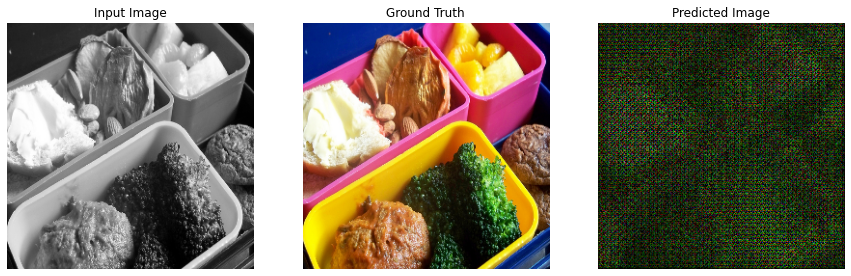

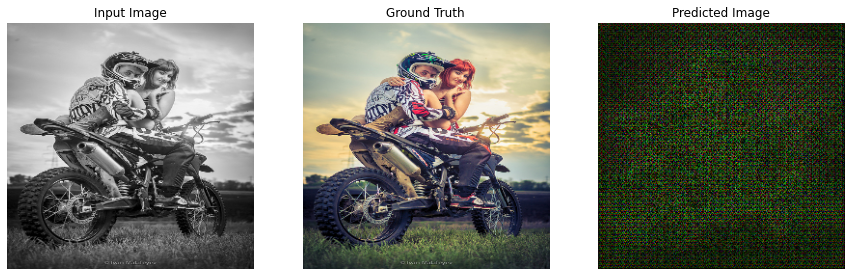

In [21]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(2):
  generate_images(generator, example_input, example_target)


In [41]:
import time
def fit(train_ds, epochs, test_ds=None, early_stopping_patience=3):
    # Track metrics for early stopping
    best_loss = float('inf')
    patience_counter = 0
    history = {
        'gen_loss': [],
        'disc_loss': [],
        'epoch_time': []
    }
    
    for epoch in range(epochs):
        start = time.time()
        
        print(f"Epoch: {epoch+1}/{epochs}")
        
        # Initialize metrics for this epoch
        epoch_gen_loss = 0
        epoch_disc_loss = 0
        num_batches = 0
        
        # Training loop
        for n, (input_image, target) in enumerate(train_ds):
            gen_loss, disc_loss = train_step(input_image, target, epoch)
            epoch_gen_loss += gen_loss
            epoch_disc_loss += disc_loss
            num_batches += 1
            
            # Print progress
            if n % 10 == 0:
                print(f"  Batch {n+1}/{len(list(train_ds))}, Gen Loss: {gen_loss:.4f}, Disc Loss: {disc_loss:.4f}")
        
        # Calculate average loss for the epoch
        avg_gen_loss = epoch_gen_loss / num_batches
        avg_disc_loss = epoch_disc_loss / num_batches
        
        # Save metrics
        history['gen_loss'].append(avg_gen_loss.numpy())
        history['disc_loss'].append(avg_disc_loss.numpy())
        
        # Check early stopping
        if avg_gen_loss < best_loss:
            best_loss = avg_gen_loss
            patience_counter = 0
            print("  New best model found! Saving weights...")
            # Save weights if needed (uncomment if you want to save weights)
            # generator.save_weights(f'generator_epoch_{epoch+1}.h5')
        else:
            patience_counter += 1
            if patience_counter >= early_stopping_patience:
                print(f"Early stopping triggered after {epoch+1} epochs")
                break
        
        epoch_time = time.time() - start
        history['epoch_time'].append(epoch_time)
        
        print(f'  Time taken for epoch {epoch+1}: {epoch_time:.2f} sec')
        print(f'  Average generator loss: {avg_gen_loss:.4f}')
        print(f'  Average discriminator loss: {avg_disc_loss:.4f}')
        print()
        
        # Show example generations every few epochs
        if epoch % 2 == 0 or epoch == epochs - 1:
            for example_input, example_target in tf.data.Dataset.zip((gray_dataset, color_dataset)).take(1):
                generate_images(generator, example_input, example_target)
            for example_input, example_target in tf.data.Dataset.zip((gray_dataset_t, color_dataset_t)).take(5):
                generate_images(generator, example_input, example_target)
    
    # After training show some test results
    print("\nShowing results on training data:")
    for example_input, example_target in tf.data.Dataset.zip((gray_dataset, color_dataset)).take(2):
        generate_images(generator, example_input, example_target)

    print("\nShowing results on test data:")
    for example_input, example_target in tf.data.Dataset.zip((gray_dataset_t, color_dataset_t)).take(5):
        generate_images(generator, example_input, example_target)
    
    # Plot training history
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history['gen_loss'], label='Generator Loss')
    plt.plot(history['disc_loss'], label='Discriminator Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training Losses')
    
    plt.subplot(1, 2, 2)
    plt.plot(history['epoch_time'])
    plt.xlabel('Epoch')
    plt.ylabel('Time (seconds)')
    plt.title('Epoch Training Time')
    plt.show()
    
    return history


Epoch: 1/15
  Batch 1/63, Gen Loss: 8.9613, Disc Loss: 1.4200
  Batch 11/63, Gen Loss: 9.6453, Disc Loss: 0.7443
  Batch 21/63, Gen Loss: 10.7319, Disc Loss: 1.2238
  Batch 31/63, Gen Loss: 9.2425, Disc Loss: 0.8239
  Batch 41/63, Gen Loss: 8.3931, Disc Loss: 1.2077
  Batch 51/63, Gen Loss: 9.3470, Disc Loss: 0.9593
  Batch 61/63, Gen Loss: 8.4259, Disc Loss: 1.1369
  New best model found! Saving weights...
  Time taken for epoch 1: 193.70 sec
  Average generator loss: 9.0897
  Average discriminator loss: 1.1064



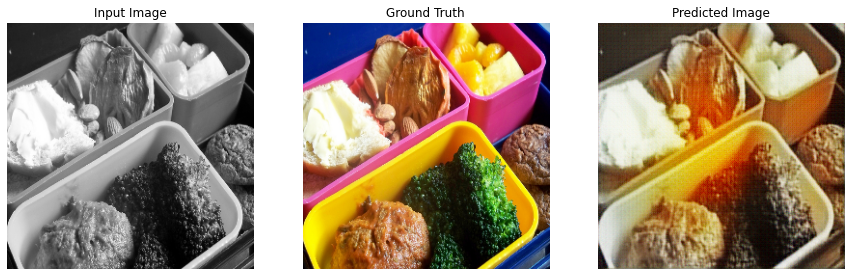

Epoch: 2/15
  Batch 1/63, Gen Loss: 9.1099, Disc Loss: 1.5727
  Batch 11/63, Gen Loss: 8.8797, Disc Loss: 1.1462
  Batch 21/63, Gen Loss: 8.7617, Disc Loss: 0.9202
  Batch 31/63, Gen Loss: 8.4427, Disc Loss: 1.3125
  Batch 41/63, Gen Loss: 8.7103, Disc Loss: 1.0401
  Batch 51/63, Gen Loss: 9.0355, Disc Loss: 1.0636
  Batch 61/63, Gen Loss: 8.2043, Disc Loss: 1.2656
  New best model found! Saving weights...
  Time taken for epoch 2: 194.83 sec
  Average generator loss: 8.7422
  Average discriminator loss: 1.2596

Epoch: 3/15
  Batch 1/63, Gen Loss: 8.8172, Disc Loss: 1.8076
  Batch 11/63, Gen Loss: 8.3338, Disc Loss: 1.2828
  Batch 21/63, Gen Loss: 9.2008, Disc Loss: 1.4970
  Batch 31/63, Gen Loss: 8.7055, Disc Loss: 1.1990
  Batch 41/63, Gen Loss: 8.0984, Disc Loss: 0.9628
  Batch 51/63, Gen Loss: 9.6051, Disc Loss: 0.9034
  Batch 61/63, Gen Loss: 8.1801, Disc Loss: 1.6503
  New best model found! Saving weights...
  Time taken for epoch 3: 194.70 sec
  Average generator loss: 8.5907
  

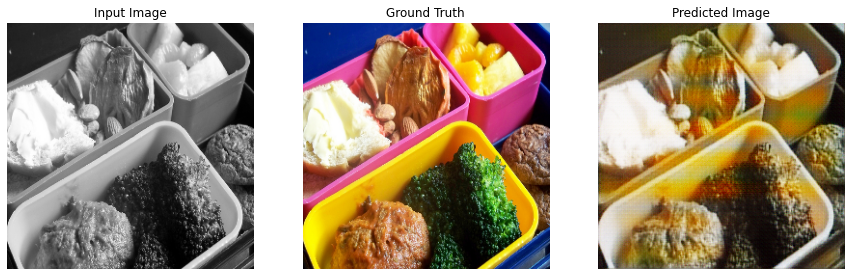

Epoch: 4/15
  Batch 1/63, Gen Loss: 8.5970, Disc Loss: 1.2771
  Batch 11/63, Gen Loss: 8.5897, Disc Loss: 1.2135
  Batch 21/63, Gen Loss: 8.0973, Disc Loss: 1.5716
  Batch 31/63, Gen Loss: 7.8978, Disc Loss: 1.2034
  Batch 41/63, Gen Loss: 7.8357, Disc Loss: 1.0446
  Batch 51/63, Gen Loss: 9.4876, Disc Loss: 1.2166
  Batch 61/63, Gen Loss: 7.5555, Disc Loss: 1.3870
  New best model found! Saving weights...
  Time taken for epoch 4: 194.23 sec
  Average generator loss: 8.3950
  Average discriminator loss: 1.2064

Epoch: 5/15
  Batch 1/63, Gen Loss: 7.7757, Disc Loss: 1.7580
  Batch 11/63, Gen Loss: 8.3234, Disc Loss: 1.3253
  Batch 21/63, Gen Loss: 9.0231, Disc Loss: 1.2892
  Batch 31/63, Gen Loss: 8.2782, Disc Loss: 1.0140
  Batch 41/63, Gen Loss: 7.8387, Disc Loss: 0.9915
  Batch 51/63, Gen Loss: 8.9580, Disc Loss: 1.1379
  Batch 61/63, Gen Loss: 7.6834, Disc Loss: 1.1728
  New best model found! Saving weights...
  Time taken for epoch 5: 193.83 sec
  Average generator loss: 8.2080
  

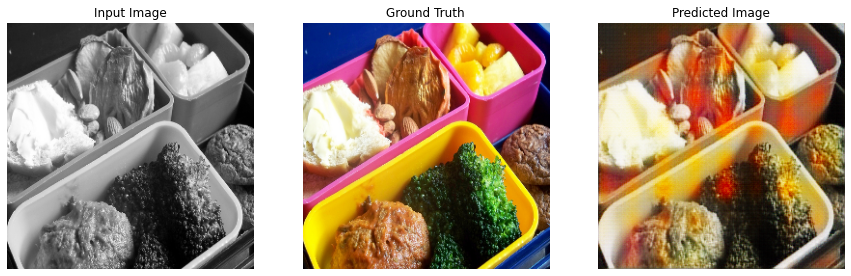

Epoch: 6/15
  Batch 1/63, Gen Loss: 8.1792, Disc Loss: 1.3150
  Batch 11/63, Gen Loss: 8.3912, Disc Loss: 1.1807
  Batch 21/63, Gen Loss: 7.7503, Disc Loss: 1.3446
  Batch 31/63, Gen Loss: 8.5625, Disc Loss: 0.7658
  Batch 41/63, Gen Loss: 7.9311, Disc Loss: 0.6397
  Batch 51/63, Gen Loss: 9.0337, Disc Loss: 0.7909
  Batch 61/63, Gen Loss: 7.1579, Disc Loss: 1.1859
  Time taken for epoch 6: 192.38 sec
  Average generator loss: 8.2759
  Average discriminator loss: 1.1974

Epoch: 7/15
  Batch 1/63, Gen Loss: 7.8221, Disc Loss: 1.2239
  Batch 11/63, Gen Loss: 8.1726, Disc Loss: 1.1527
  Batch 21/63, Gen Loss: 8.7413, Disc Loss: 1.1620
  Batch 31/63, Gen Loss: 8.8111, Disc Loss: 1.0848
  Batch 41/63, Gen Loss: 7.0659, Disc Loss: 1.1321
  Batch 51/63, Gen Loss: 8.9181, Disc Loss: 1.1383
  Batch 61/63, Gen Loss: 7.2721, Disc Loss: 1.2709
  New best model found! Saving weights...
  Time taken for epoch 7: 192.56 sec
  Average generator loss: 8.0430
  Average discriminator loss: 1.1794



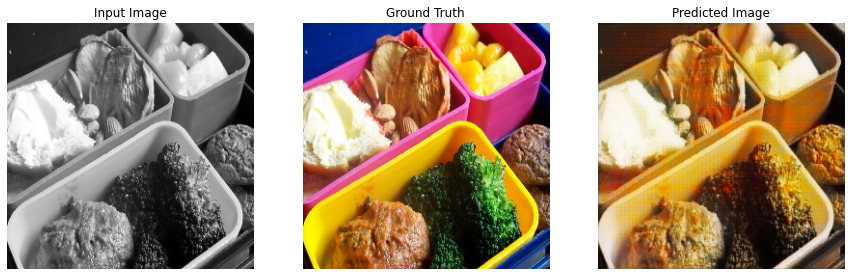

Epoch: 8/15
  Batch 1/63, Gen Loss: 7.3135, Disc Loss: 1.5488
  Batch 11/63, Gen Loss: 8.4864, Disc Loss: 1.1247
  Batch 21/63, Gen Loss: 8.3160, Disc Loss: 0.8231
  Batch 31/63, Gen Loss: 7.7539, Disc Loss: 0.6149
  Batch 41/63, Gen Loss: 7.5618, Disc Loss: 0.5956
  Batch 51/63, Gen Loss: 9.8604, Disc Loss: 0.1368
  Batch 61/63, Gen Loss: 9.9776, Disc Loss: 0.0790
  Time taken for epoch 8: 192.23 sec
  Average generator loss: 8.7378
  Average discriminator loss: 0.8708

Epoch: 9/15
  Batch 1/63, Gen Loss: 10.7028, Disc Loss: 1.4970
  Batch 11/63, Gen Loss: 8.5886, Disc Loss: 0.2172
  Batch 21/63, Gen Loss: 10.4408, Disc Loss: 0.0435
  Batch 31/63, Gen Loss: 10.4256, Disc Loss: 0.0392
  Batch 41/63, Gen Loss: 8.5731, Disc Loss: 0.1404
  Batch 51/63, Gen Loss: 7.7824, Disc Loss: 0.5886
  Batch 61/63, Gen Loss: 7.5474, Disc Loss: 0.2728
  Time taken for epoch 9: 192.46 sec
  Average generator loss: 9.4458
  Average discriminator loss: 0.4942



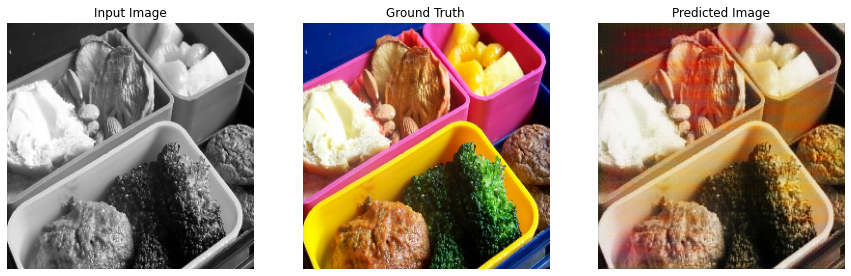

Epoch: 10/15
  Batch 1/63, Gen Loss: 10.0907, Disc Loss: 0.0490
  Batch 11/63, Gen Loss: 10.6309, Disc Loss: 0.0414
  Batch 21/63, Gen Loss: 11.3037, Disc Loss: 0.0071
  Batch 31/63, Gen Loss: 10.4826, Disc Loss: 0.0756
  Batch 41/63, Gen Loss: 9.8117, Disc Loss: 0.0995
  Batch 51/63, Gen Loss: 12.6657, Disc Loss: 0.0073
  Batch 61/63, Gen Loss: 11.0280, Disc Loss: 0.0103
Early stopping triggered after 10 epochs

Showing results on training data:


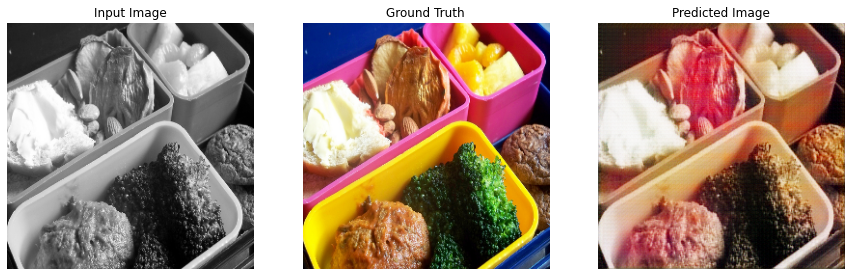

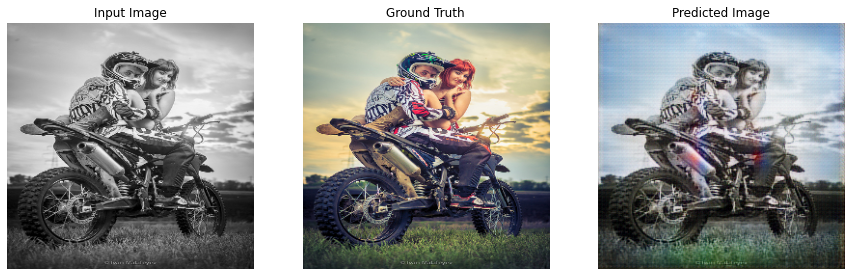


Showing results on test data:


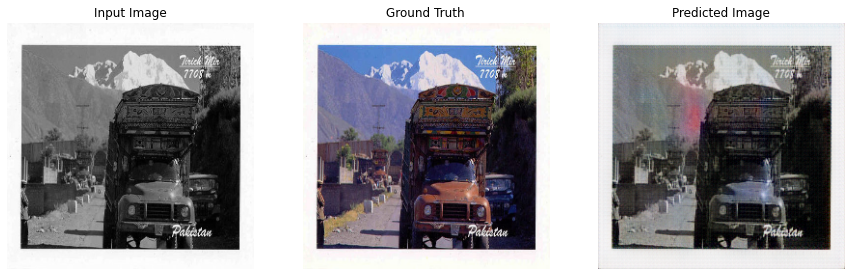

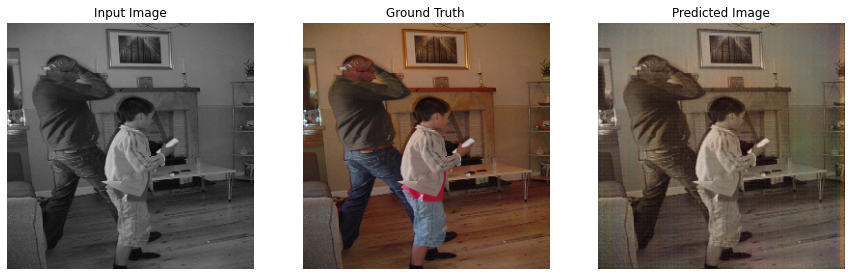

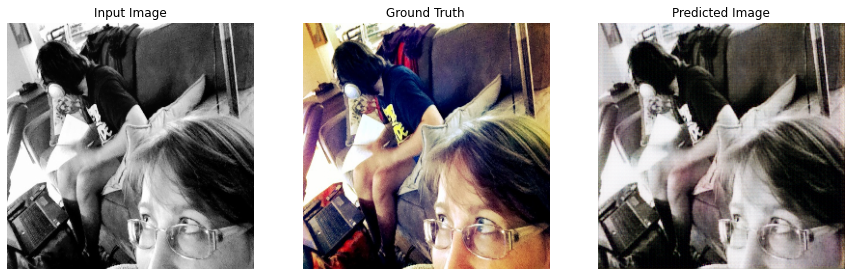

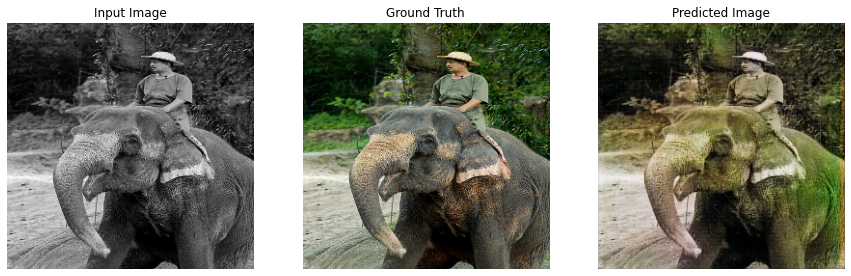

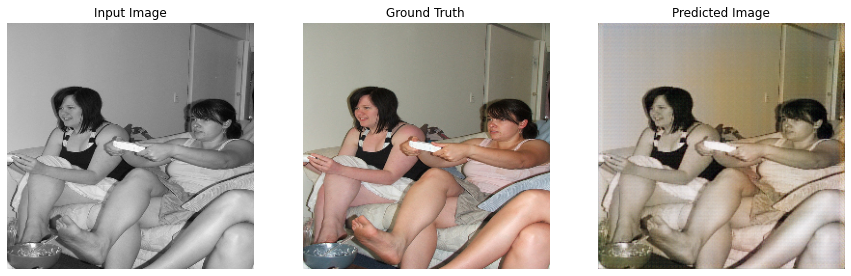

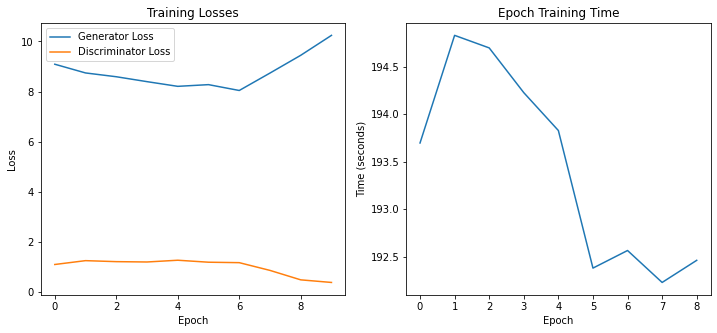

{'gen_loss': [9.089734,
  8.742211,
  8.590681,
  8.395046,
  8.208033,
  8.275931,
  8.042992,
  8.737787,
  9.445822,
  10.240585],
 'disc_loss': [1.1064042,
  1.259642,
  1.2199217,
  1.2063667,
  1.2762909,
  1.1973673,
  1.1793982,
  0.87078154,
  0.49422956,
  0.3907119],
 'epoch_time': [193.69724822044373,
  194.83157896995544,
  194.69928741455078,
  194.22776913642883,
  193.8287057876587,
  192.3788502216339,
  192.56426978111267,
  192.22768020629883,
  192.46082639694214]}

In [42]:
fit(tf.data.Dataset.zip((gray_dataset, color_dataset)), epochs=15)

In [ ]:
def generate_images_original(model, test_input, target):
    prediction = model(test_input, training=False)
    
    plt.figure(figsize=(15, 5))
    
    display_list = [test_input[0], target[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']
    
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Getting the pixel values between [0, 1] to plot it
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in tf.data.Dataset.zip((gray_dataset_t,color_dataset_t)).take(2):
  generate_images(generator, example_input, example_target)

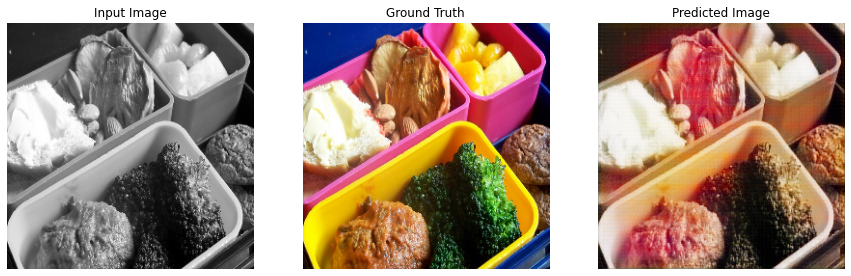

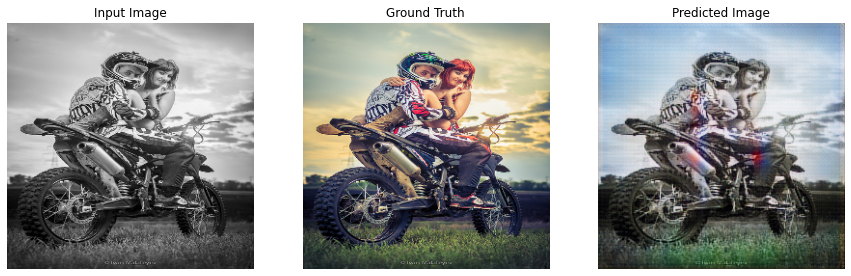

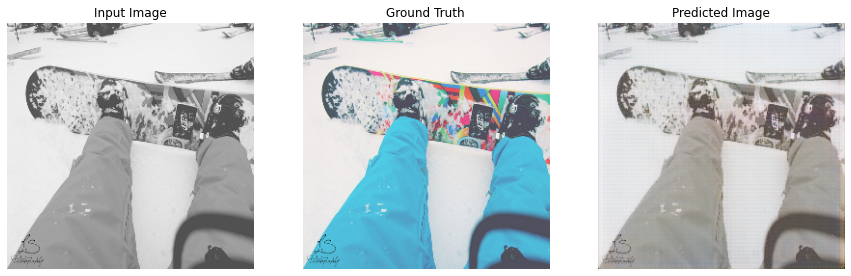

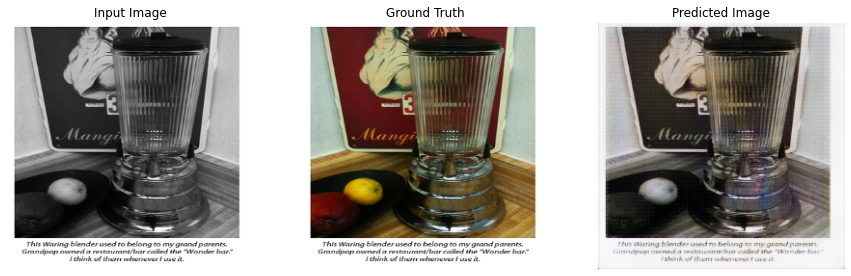

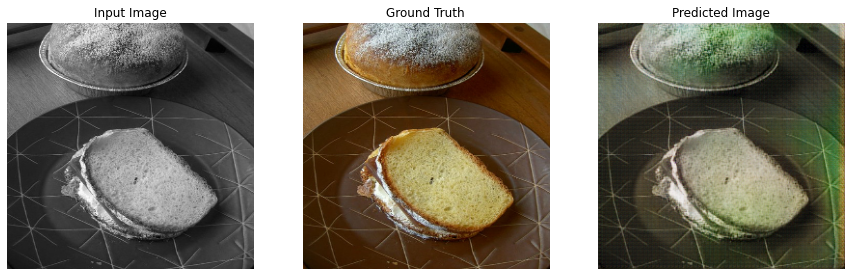

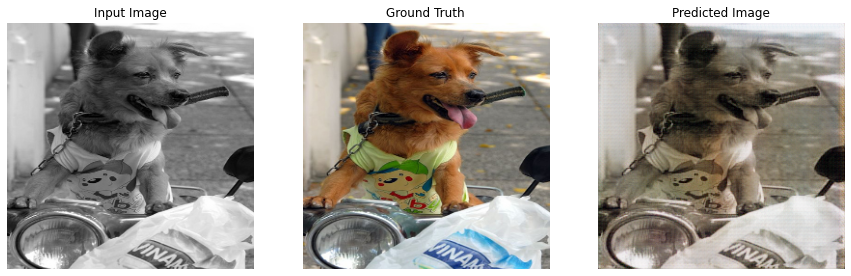

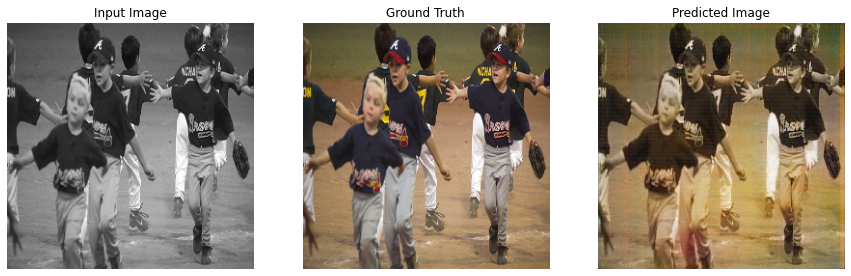

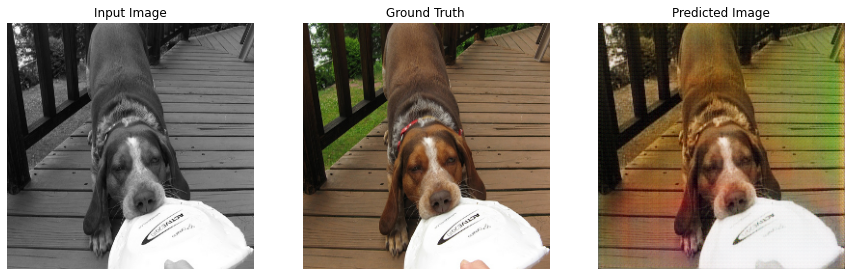

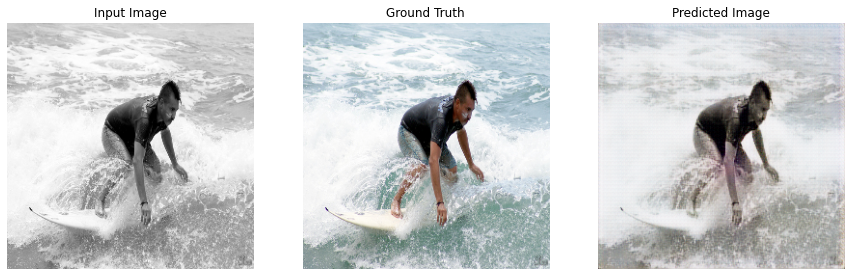

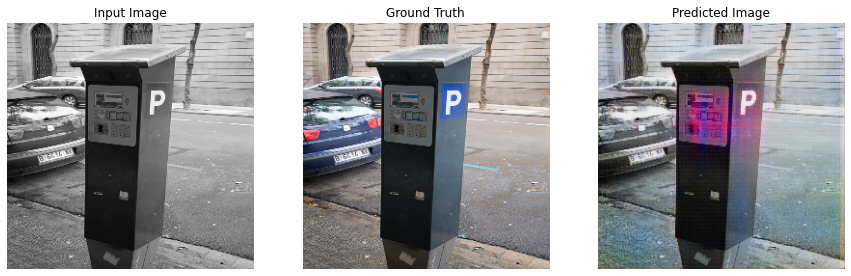

In [43]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(10):
    generate_images(generator, example_input, example_target)

In [44]:
def save_models(generator_model, discriminator_model, save_path='saved_models'):
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    
    generator_model.save(os.path.join(save_path, 'generator.h5'))
    print(f"Generator model saved to {os.path.join(save_path, 'generator.h5')}")

    discriminator_model.save(os.path.join(save_path, 'discriminator.h5'))
    print(f"Discriminator model saved to {os.path.join(save_path, 'discriminator.h5')}")

    generator_model.save_weights(os.path.join(save_path, 'generator_weights.h5'))
    discriminator_model.save_weights(os.path.join(save_path, 'discriminator_weights.h5'))
    print("Model weights saved successfully")


save_models(generator, discriminator)

Generator model saved to saved_models/generator.h5
Discriminator model saved to saved_models/discriminator.h5
Model weights saved successfully


In [45]:

def load_models(load_path='saved_models'):

    loaded_generator = tf.keras.models.load_model(os.path.join(load_path, 'generator.h5'))
    print("Generator model loaded successfully")
    

    # loaded_discriminator = tf.keras.models.load_model(os.path.join(load_path, 'discriminator.h5'))
    # print("Discriminator model loaded successfully")
    
    return loaded_generator

loaded_generator = load_models()

Generator model loaded successfully


In [46]:
def increase_saturation(image, saturation_factor=1.5):


    if isinstance(image, tf.Tensor):
        image = image.numpy()
    

    if image.max() > 1.0:
        image = image / 255.0
    

    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    

    hsv_image[:, :, 1] = np.clip(hsv_image[:, :, 1] * saturation_factor, 0, 1)
    

    saturated_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB)
    
    return saturated_image

In [51]:
def colorize_and_compare(img_file, saturation_factor=2.0):

    gray_img_path = f'/kaggle/input/landscape-image-colorization/landscape Images/gray/{img_file}.jpg'
    true_color_img_path = f'/kaggle/input/landscape-image-colorization/landscape Images/color/{img_file}.jpg'
    
    gray_img = cv2.imread(gray_img_path, 1)
    if gray_img is None:
        print(f"Error: Could not load grayscale image at {gray_img_path}")
        return None
        
    gray_img = cv2.cvtColor(gray_img, cv2.COLOR_BGR2RGB)
    gray_img_resized = cv2.resize(gray_img, (SIZE, SIZE))
    gray_img_normalized = gray_img_resized.astype('float32') / 255.0
    
    true_color_img = cv2.imread(true_color_img_path, 1)
    if true_color_img is None:
        print(f"Error: Could not load color image at {true_color_img_path}")
        return None
        
    true_color_img = cv2.cvtColor(true_color_img, cv2.COLOR_BGR2RGB)
    true_color_img_resized = cv2.resize(true_color_img, (SIZE, SIZE))
    true_color_img_normalized = true_color_img_resized.astype('float32') / 255.0
    
    test_img_tensor = tf.convert_to_tensor(gray_img_normalized)
    test_img_tensor = tf.expand_dims(test_img_tensor, 0)  
    

    generated_image = loaded_generator(test_img_tensor, training=False)
    generated_image_np = tf.squeeze(generated_image).numpy()
    
    saturated_image = increase_saturation(generated_image_np, saturation_factor=saturation_factor)
    
    plt.figure(figsize=(20, 5))

    plt.subplot(1, 4, 1)
    plt.title('Grayscale Image')
    plt.imshow(gray_img_resized)
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title('Original Color Image')
    plt.imshow(true_color_img_resized)
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title('Model Prediction')
    plt.imshow(generated_image_np)
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.title('Enhanced Saturation')
    plt.imshow(saturated_image)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

    # # Return the processed images dictionary
    # return {
    #     'grayscale': gray_img_resized,
    #     'true_color': true_color_img_resized,
    #     'prediction': generated_image_np,
    #     'enhanced': saturated_image
    # }



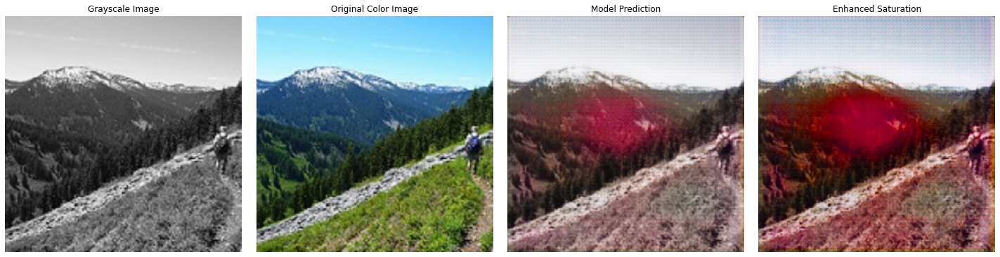

error: OpenCV(4.5.1) /tmp/pip-req-build-tk9iuyva/opencv/modules/imgcodecs/src/loadsave.cpp:682: error: (-2:Unspecified error) could not find a writer for the specified extension in function 'imwrite_'


In [52]:
colorize_and_compare('6028')

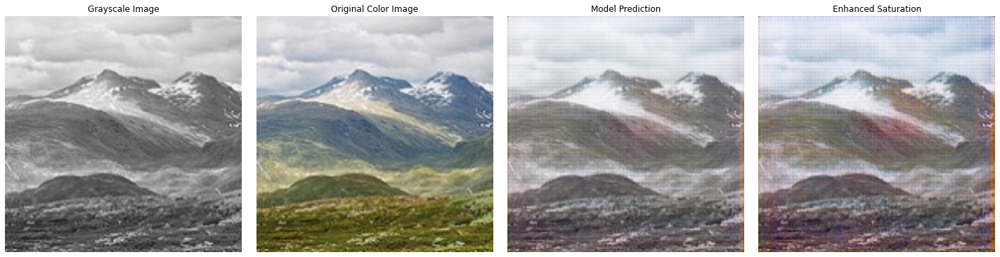

error: OpenCV(4.5.1) /tmp/pip-req-build-tk9iuyva/opencv/modules/imgcodecs/src/loadsave.cpp:682: error: (-2:Unspecified error) could not find a writer for the specified extension in function 'imwrite_'


In [53]:
colorize_and_compare('6550')

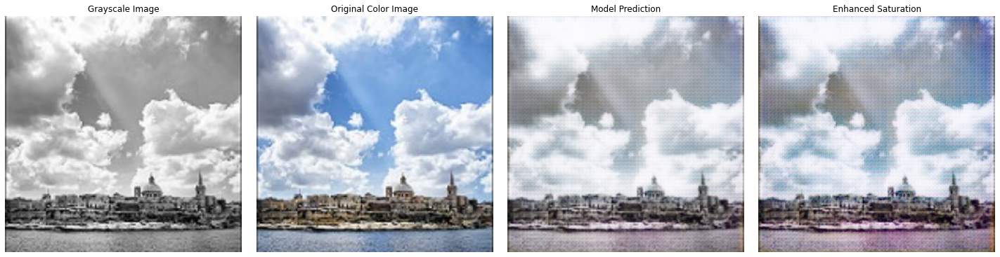

error: OpenCV(4.5.1) /tmp/pip-req-build-tk9iuyva/opencv/modules/imgcodecs/src/loadsave.cpp:682: error: (-2:Unspecified error) could not find a writer for the specified extension in function 'imwrite_'


In [55]:
colorize_and_compare('650')

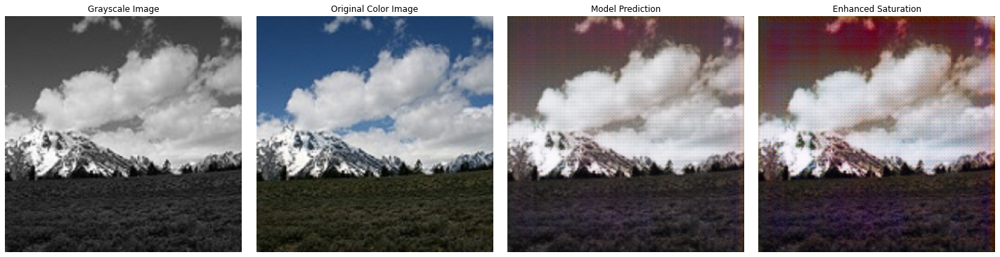

error: OpenCV(4.5.1) /tmp/pip-req-build-tk9iuyva/opencv/modules/imgcodecs/src/loadsave.cpp:682: error: (-2:Unspecified error) could not find a writer for the specified extension in function 'imwrite_'


In [56]:
colorize_and_compare('6120')